# imports

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_selection import mutual_info_classif
import matplotlib.pyplot as plt
import lightgbm as lgb
from sklearn.metrics import accuracy_score
import seaborn as sns
import lightgbm as lgb

# Augment and preprocess data

Found 2800 images belonging to 4 classes.
Found 600 images belonging to 4 classes.
Found 600 images belonging to 4 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━

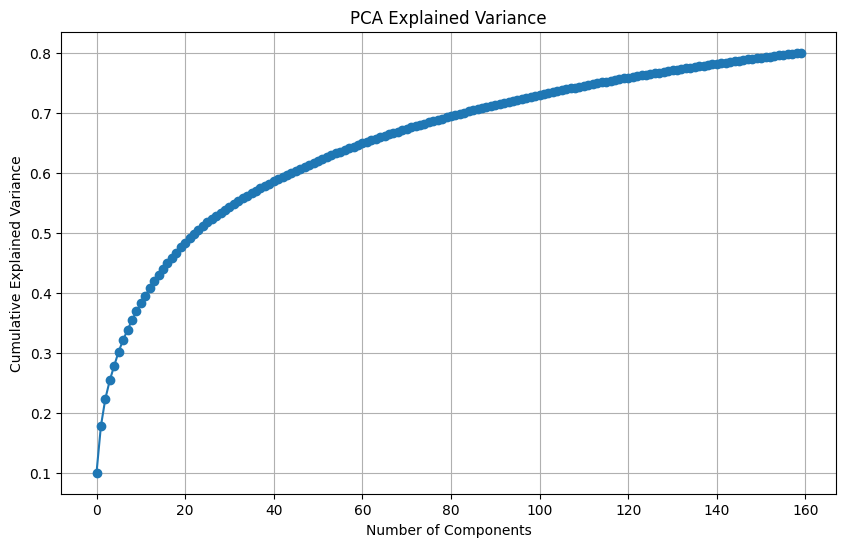

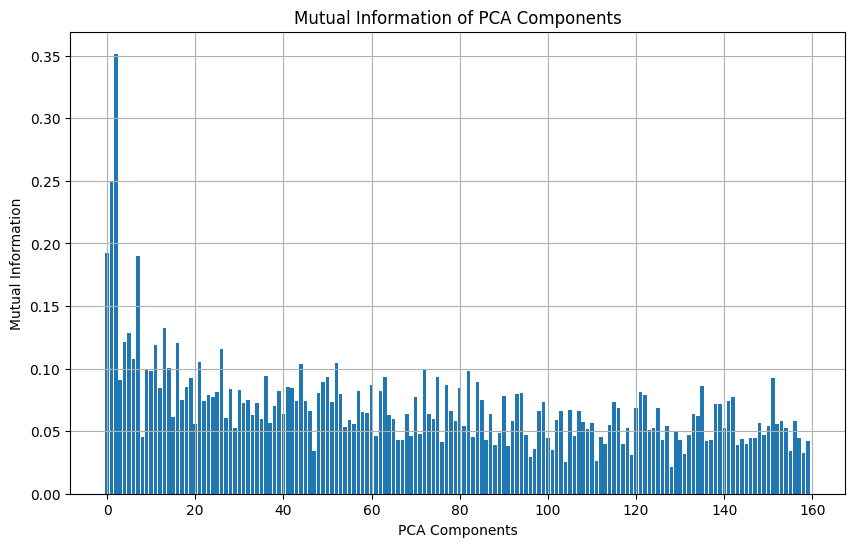

In [4]:
img_height, img_width = 224, 224  # ResNet50 requires 224x224 input size
path_to_images = 'Intel-Image-Subset'

categories = ['building', 'forest', 'mountain', 'sea']

train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    os.path.join(path_to_images, 'train'),
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

test_datagen = ImageDataGenerator(rescale=1./255)  # Only normalize the pixel values
val_datagen = ImageDataGenerator(rescale=1./255)   # Only normalize the pixel values

test_generator = test_datagen.flow_from_directory(
    os.path.join(path_to_images, 'test'),
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Don't shuffle test set
)

val_generator = val_datagen.flow_from_directory(
    os.path.join(path_to_images, 'val'),
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Don't shuffle validation set
)

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

def extract_features(generator):
    features = []
    labels = []
    for i in range(generator.samples // generator.batch_size):
        x_batch, y_batch = next(generator)  # Corrected to use 'next()' on generator
        feature_batch = feature_extractor.predict(x_batch)  # Extract features from the batch
        features.append(feature_batch)
        labels.append(y_batch)
    features = np.concatenate(features)
    labels = np.concatenate(labels)
    return features, labels

train_features, train_labels = extract_features(train_generator)
test_features, test_labels = extract_features(test_generator)
val_features, val_labels = extract_features(val_generator)

train_features_flattened = train_features.reshape(train_features.shape[0], -1)
test_features_flattened = test_features.reshape(test_features.shape[0], -1)
val_features_flattened = val_features.reshape(val_features.shape[0], -1)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_features_flattened)
X_test_scaled = scaler.transform(test_features_flattened)
X_val_scaled = scaler.transform(val_features_flattened)

pca = PCA(n_components=0.80)  
X_train_pca = pca.fit_transform(X_train_scaled)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid(True)
plt.show()

mi = mutual_info_classif(X_train_pca, train_labels.argmax(axis=1))  # Use argmax to get class indices
mi_df = pd.DataFrame(mi, columns=['Mutual Information'])

plt.figure(figsize=(10, 6))
plt.bar(range(len(mi)), mi)
plt.xlabel('PCA Components')
plt.ylabel('Mutual Information')
plt.title('Mutual Information of PCA Components')
plt.grid(True)
plt.show()

k = 30  # Adjust k based on how many top features you want to select
top_k_features = np.argsort(mi)[-k:]  # Indices of the k highest MI components

X_test_pca = pca.transform(X_test_scaled)
X_val_pca = pca.transform(X_val_scaled)

X_train_selected = X_train_pca[:, top_k_features]
X_test_selected = X_test_pca[:, top_k_features]
X_val_selected = X_val_pca[:, top_k_features]

# Gradient Boosting (LightGBM)

### Tuning parameters
#### learning_rate and n_estimators

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 2784, number of used features: 30
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.383425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

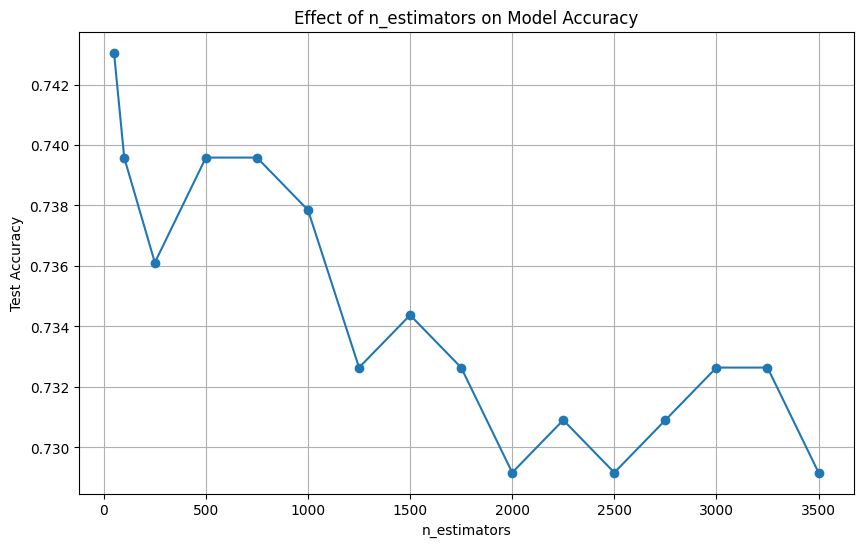

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 2784, number of used features: 30
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.383425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

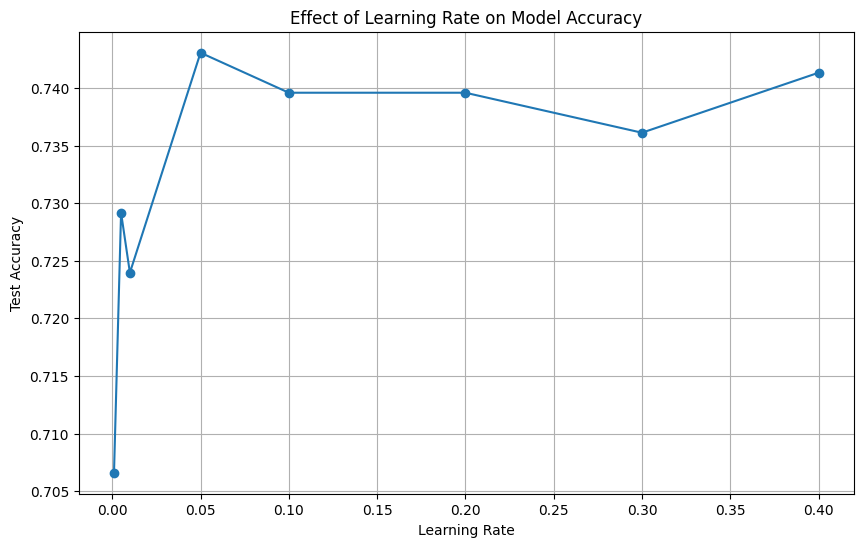

In [6]:
# Set baseline parameters
baseline_params = {
    'random_state': 42,
    'num_leaves': 63,
    'max_depth': 5,
    'min_child_samples': 20,
    'feature_fraction': 1.0
}

# Define ranges for each parameter
n_estimators_range = [50, 100, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500]
learning_rate_range = [0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4]

# Record results
n_estimators_results = []
learning_rate_results = []

# Test varying n_estimators
for n_estimators in n_estimators_range:
    lgb_model = lgb.LGBMClassifier(n_estimators=n_estimators, learning_rate=0.1, **baseline_params)
    lgb_model.fit(X_train_selected, train_labels.argmax(axis=1))
    y_test_pred = lgb_model.predict(X_test_selected)
    test_accuracy = accuracy_score(test_labels.argmax(axis=1), y_test_pred)
    n_estimators_results.append((n_estimators, test_accuracy))

# Plot n_estimators results
plt.figure(figsize=(10, 6))
plt.plot([x[0] for x in n_estimators_results], [x[1] for x in n_estimators_results], marker='o')
plt.xlabel('n_estimators')
plt.ylabel('Test Accuracy')
plt.title('Effect of n_estimators on Model Accuracy')
plt.grid(True)
plt.show()

# Test varying learning_rate
for learning_rate in learning_rate_range:
    lgb_model = lgb.LGBMClassifier(n_estimators=100, learning_rate=learning_rate, **baseline_params)
    lgb_model.fit(X_train_selected, train_labels.argmax(axis=1))
    y_test_pred = lgb_model.predict(X_test_selected)
    test_accuracy = accuracy_score(test_labels.argmax(axis=1), y_test_pred)
    learning_rate_results.append((learning_rate, test_accuracy))

# Plot learning_rate results
plt.figure(figsize=(10, 6))
plt.plot([x[0] for x in learning_rate_results], [x[1] for x in learning_rate_results], marker='o')
plt.xlabel('Learning Rate')
plt.ylabel('Test Accuracy')
plt.title('Effect of Learning Rate on Model Accuracy')
plt.grid(True)
plt.show()


#### num_leaves and max_depth

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 2784, number of used features: 30
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.383425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

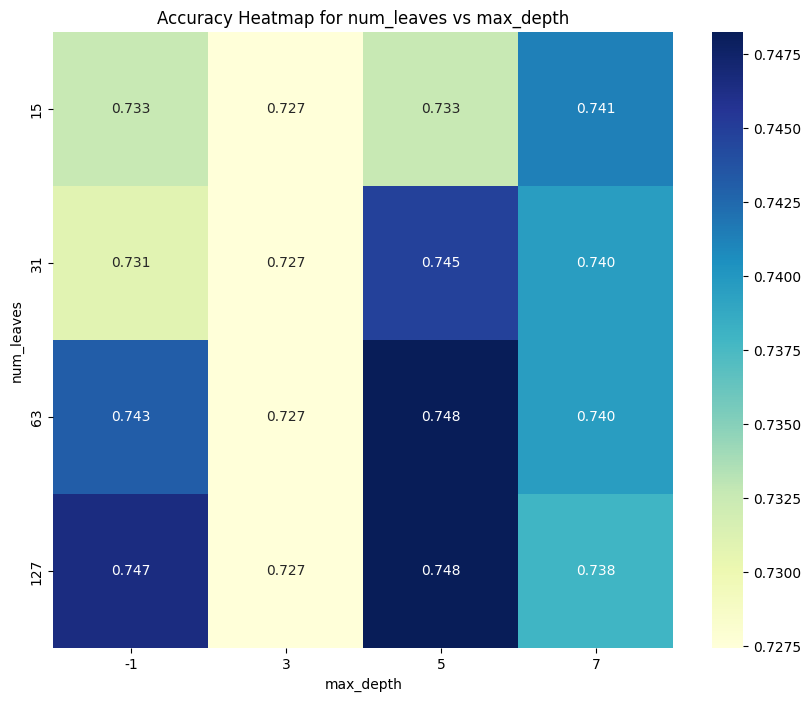

In [7]:
# Initialize lists to record results
depth_leaf_results = []

# Test num_leaves and max_depth in combination
for num_leaves in [15, 31, 63, 127]:
    for max_depth in [3, 5, 7, -1]:
        # Create a copy of baseline_params and update with loop-specific parameters
        params = baseline_params.copy()
        params.update({
            'n_estimators': 500,
            'learning_rate': 0.05,
            'num_leaves': num_leaves,
            'max_depth': max_depth
        })
        
        # Initialize model with updated parameters
        lgb_model = lgb.LGBMClassifier(**params)
        
        # Train and test the model
        lgb_model.fit(X_train_selected, train_labels.argmax(axis=1))
        y_test_pred = lgb_model.predict(X_test_selected)
        test_accuracy = accuracy_score(test_labels.argmax(axis=1), y_test_pred)
        
        # Record results
        depth_leaf_results.append((num_leaves, max_depth, test_accuracy))

# Convert results to a DataFrame
depth_leaf_df = pd.DataFrame(depth_leaf_results, columns=['num_leaves', 'max_depth', 'test_accuracy'])

# Pivot the DataFrame to prepare for the heatmap
depth_leaf_pivot = depth_leaf_df.pivot(index='num_leaves', columns='max_depth', values='test_accuracy')

# Plot heatmap of num_leaves vs max_depth
plt.figure(figsize=(10, 8))
sns.heatmap(depth_leaf_pivot, annot=True, fmt=".3f", cmap="YlGnBu")
plt.title('Accuracy Heatmap for num_leaves vs max_depth')
plt.xlabel('max_depth')
plt.ylabel('num_leaves')
plt.show()



## Tuned paramteres

In [8]:
lgb_model = lgb.LGBMClassifier(
    n_estimators=2000,
    num_leaves=63,
    max_depth=7,
    learning_rate=0.05,
    random_state=42
)

# Train using the selected features
lgb_model.fit(X_train_selected, train_labels.argmax(axis=1))

# Make predictions on the test and validation sets
y_test_pred_lgb = lgb_model.predict(X_test_selected)
y_val_pred_lgb = lgb_model.predict(X_val_selected)

# Calculate the accuracy on the test and validation sets
test_accuracy_lgb = accuracy_score(test_labels.argmax(axis=1), y_test_pred_lgb)
val_accuracy_lgb = accuracy_score(val_labels.argmax(axis=1), y_val_pred_lgb)

print(f"LightGBM Test Accuracy: {test_accuracy_lgb:.4f}")
print(f"LightGBM Validation Accuracy: {val_accuracy_lgb:.4f}")

# Classification report for test and validation sets
test_report_lgb = classification_report(test_labels.argmax(axis=1), y_test_pred_lgb)
val_report_lgb = classification_report(val_labels.argmax(axis=1), y_val_pred_lgb)

print("LightGBM Classification Report (Test Set):\n", test_report_lgb)
print("LightGBM Classification Report (Validation Set):\n", val_report_lgb)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 2784, number of used features: 30
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.383425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

## Default parameters

In [9]:
lgb_model = lgb.LGBMClassifier(
    n_estimators=100,
    num_leaves=31,
    max_depth=-1,
    learning_rate=0.1,
    random_state=42
)

# Train using the selected features
lgb_model.fit(X_train_selected, train_labels.argmax(axis=1))

# Make predictions on the test and validation sets
y_test_pred_lgb = lgb_model.predict(X_test_selected)
y_val_pred_lgb = lgb_model.predict(X_val_selected)

# Calculate the accuracy on the test and validation sets
test_accuracy_lgb = accuracy_score(test_labels.argmax(axis=1), y_test_pred_lgb)
val_accuracy_lgb = accuracy_score(val_labels.argmax(axis=1), y_val_pred_lgb)

print(f"LightGBM Test Accuracy: {test_accuracy_lgb:.4f}")
print(f"LightGBM Validation Accuracy: {val_accuracy_lgb:.4f}")

# Classification report for test and validation sets
test_report_lgb = classification_report(test_labels.argmax(axis=1), y_test_pred_lgb)
val_report_lgb = classification_report(val_labels.argmax(axis=1), y_val_pred_lgb)

print("LightGBM Classification Report (Test Set):\n", test_report_lgb)
print("LightGBM Classification Report (Validation Set):\n", val_report_lgb)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 2784, number of used features: 30
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.387732
[LightGBM] [Info] Start training from score -1.383425
LightGBM Test Accuracy: 0.7292
LightGBM Validation Accuracy: 0.7483
LightGBM Classification Report (Test Set):
               precision    recall  f1-score   support

           0       0.71      0.86      0.78       150
           1       0.88      0.85      0.86       150
           2       0.72      0.51      0.59       150
           3       0.61      0.69      0.65       126

    accuracy                           0.73       576
   macro avg       0.73      0.73      0.72       576
weig